# Control Blood preprocessing - Lou dataset

In [1]:
suppressPackageStartupMessages({
    library(Seurat)
    library(dplyr)
    library(data.table)
    library(ggplot2)
    library(patchwork)
    library(harmony)
    library(entropy)
    library(presto)
    library(singlecellmethods)
    library(lme4)
    library(purrr)
    library(scDblFinder)
    library(BiocParallel)
    library(ggridges)
    library(ggthemes)
    library(zellkonverter)
})



fig.size <- function(h, w) {
    options(repr.plot.height = h, repr.plot.width = w)
}

In [52]:
1

[1] 1

In [3]:
RNA_path <- "/data/brennerlab/Shani/projects/Treg/data/external_datasets/Ctrl_blood_Luo/cellranger_outs/"
meta_path <- "/data/brennerlab/Shani/projects/Treg/data/external_datasets/Ctrl_blood_Luo/Supplementary_Data_1_metadata.csv"
save_path <- "/data/brennerlab/Shani/projects/Treg/analysis/Ctrl_bl"

In [3]:
RNA_sampList <- list.files(path = RNA_path)

In [4]:
RNA_sampList

[1] "SRR14664409_GSM5342391_Treg_HD_PB1" "SRR14664410_GSM5342392_Treg_HD_PB2"
[3] "SRR14664411_GSM5342393_Treg_HD_PB3" "SRR14664412_GSM5342394_Treg_HD_PB4"
[5] "SRR14664413_GSM5342395_Treg_HD_PB5" "SRR14664414_GSM5342396_Treg_HD_PB6"
[7] "SRR14664415_GSM5342397_Treg_HD_PB7" "SRR14664416_GSM5342398_Treg_HD_PB8"

In [5]:
all.samples<- data.frame(RNA_sampList)
all.samples <- all.samples%>% mutate(samplename = RNA_sampList) %>% 
                tidyr::separate(col = RNA_sampList, sep = "_", into = c("a","b","celltype","treatment","donorID"))%>% 
                tidyr::unite("library", c("a","b")) %>% 
                mutate(tissue = "PB") %>% 
                mutate(donorID = gsub("PB", "HD", donorID))#%>% 
                # mutate(seq_repeat = ifelse(is.na(seq_repeat), 1, seq_repeat))%>% select(c(-a, -f)) %>% mutate(sampleName = gsub("Sample_", "", samplePath))
all.samples

library,celltype,treatment,donorID,samplename,tissue
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
SRR14664409_GSM5342391,Treg,HD,HD1,SRR14664409_GSM5342391_Treg_HD_PB1,PB
SRR14664410_GSM5342392,Treg,HD,HD2,SRR14664410_GSM5342392_Treg_HD_PB2,PB
SRR14664411_GSM5342393,Treg,HD,HD3,SRR14664411_GSM5342393_Treg_HD_PB3,PB
SRR14664412_GSM5342394,Treg,HD,HD4,SRR14664412_GSM5342394_Treg_HD_PB4,PB
SRR14664413_GSM5342395,Treg,HD,HD5,SRR14664413_GSM5342395_Treg_HD_PB5,PB
SRR14664414_GSM5342396,Treg,HD,HD6,SRR14664414_GSM5342396_Treg_HD_PB6,PB
SRR14664415_GSM5342397,Treg,HD,HD7,SRR14664415_GSM5342397_Treg_HD_PB7,PB
SRR14664416_GSM5342398,Treg,HD,HD8,SRR14664416_GSM5342398_Treg_HD_PB8,PB


In [6]:
#load metadata
metadata <- read.csv(meta_path) %>% mutate(Sample.name = gsub("-.*", "", Sample.name)) %>% 
            filter(Healthy.donor.Disease == "healthy donor" & Organ == "PB" & Cell.type == "Treg cells") %>% 
            select(Sample.name, Sex..F.M., Recipient.Age, sequencing.technology) %>% 
            mutate(sequencing.technology = if_else(grepl(pattern = "v3", sequencing.technology), "scRNAseq3", "scRNA_VDJ5")) %>% 
            left_join(., all.samples, by = join_by(Sample.name == donorID)) 
colnames(metadata) <- c("donorID", "sex", "age", "sequencing.technology", "library", "celltype", "disease", "sample_name", "tissue")
metadata

donorID,sex,age,sequencing.technology,library,celltype,disease,sample_name,tissue
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
HD1,M,40,scRNAseq3,SRR14664409_GSM5342391,Treg,HD,SRR14664409_GSM5342391_Treg_HD_PB1,PB
HD2,F,34,scRNAseq3,SRR14664410_GSM5342392,Treg,HD,SRR14664410_GSM5342392_Treg_HD_PB2,PB
HD3,M,26,scRNAseq3,SRR14664411_GSM5342393,Treg,HD,SRR14664411_GSM5342393_Treg_HD_PB3,PB
HD4,M,45,scRNA_VDJ5,SRR14664412_GSM5342394,Treg,HD,SRR14664412_GSM5342394_Treg_HD_PB4,PB
HD5,M,25,scRNA_VDJ5,SRR14664413_GSM5342395,Treg,HD,SRR14664413_GSM5342395_Treg_HD_PB5,PB
HD6,M,19,scRNA_VDJ5,SRR14664414_GSM5342396,Treg,HD,SRR14664414_GSM5342396_Treg_HD_PB6,PB
HD7,F,25,scRNA_VDJ5,SRR14664415_GSM5342397,Treg,HD,SRR14664415_GSM5342397_Treg_HD_PB7,PB
HD8,F,30,scRNA_VDJ5,SRR14664416_GSM5342398,Treg,HD,SRR14664416_GSM5342398_Treg_HD_PB8,PB


In [7]:
# meta2 <- ctrl.bl@meta.data  %>% left_join(., metadata %>% select(donorID, sequencing.technology), by = join_by(donorID))
# ctrl.bl <- AddMetaData(ctrl.bl, meta2$sequencing.technology, "sequencing.technology")

## Load expression data

In [8]:
# gexData <- Seurat::Read10X_h5(paste(RNA_path, all.samples$samplename[1], "/outs/filtered_feature_bc_matrix.h5", sep=''), use.names = T, unique.features = T)

# Obj.list <- c()
for (i in seq(1,length(RNA_sampList))) {
    gexData <- suppressMessages(Read10X_h5(paste(RNA_path, RNA_sampList[i], "/outs/filtered_feature_bc_matrix.h5", sep=''), use.names = T, unique.features = T))
    tempRNA <- CreateSeuratObject(counts = gexData,  project = paste0("HD_Luo_",all.samples$donorID[i]))
    #add metadata
    donor.metadata <- metadata[metadata$donorID == all.samples$donorID[i],] %>% lapply(rep, dim(gexData)[2])  %>% as.data.frame() 
    rownames(donor.metadata) <- colnames(tempRNA)
    
    tempRNA <- AddMetaData(tempRNA, donor.metadata)

    if(i == 1){
        ctrl.bl <- tempRNA
        } else {
        ctrl.bl <- merge(ctrl.bl, tempRNA)
        }
    print(glue::glue("Added data from donor {i}"))
    #add obj to list of objects
    # Obj.list <- c(Obj.list, tempRNA)
}


Added data from donor 1


Warning message:
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


Added data from donor 2
Added data from donor 3


Warning message:
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


Added data from donor 4
Added data from donor 5


Warning message:
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


Added data from donor 6
Added data from donor 7


Warning message:
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


Added data from donor 8


In [9]:
ctrl.bl

An object of class Seurat 
36601 features across 62012 samples within 1 assay 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data

In [10]:
ctrl.bl@meta.data%>% head()
ctrl.bl$donorID%>% unique

,orig.ident,nCount_RNA,nFeature_RNA,donorID,sex,age,sequencing.technology,library,celltype,disease,sample_name,tissue
,<chr>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AAACCTGCAGTACACT-1_1_1_1_1,HD_Luo_HD1,1857,1158,HD1,M,40,scRNAseq3,SRR14664409_GSM5342391,Treg,HD,SRR14664409_GSM5342391_Treg_HD_PB1,PB
AAACCTGCATTGGGCC-1_1_1_1_1,HD_Luo_HD1,6784,2391,HD1,M,40,scRNAseq3,SRR14664409_GSM5342391,Treg,HD,SRR14664409_GSM5342391_Treg_HD_PB1,PB
AAACCTGGTTGCTCCT-1_1_1_1_1,HD_Luo_HD1,3729,1880,HD1,M,40,scRNAseq3,SRR14664409_GSM5342391,Treg,HD,SRR14664409_GSM5342391_Treg_HD_PB1,PB
AAACGGGAGCACCGCT-1_1_1_1_1,HD_Luo_HD1,2079,1171,HD1,M,40,scRNAseq3,SRR14664409_GSM5342391,Treg,HD,SRR14664409_GSM5342391_Treg_HD_PB1,PB
AAACGGGAGCCCAGCT-1_1_1_1_1,HD_Luo_HD1,2385,1027,HD1,M,40,scRNAseq3,SRR14664409_GSM5342391,Treg,HD,SRR14664409_GSM5342391_Treg_HD_PB1,PB
AAACGGGGTAAGAGGA-1_1_1_1_1,HD_Luo_HD1,9478,3191,HD1,M,40,scRNAseq3,SRR14664409_GSM5342391,Treg,HD,SRR14664409_GSM5342391_Treg_HD_PB1,PB


[1] "HD1" "HD2" "HD3" "HD4" "HD5" "HD6" "HD7" "HD8"

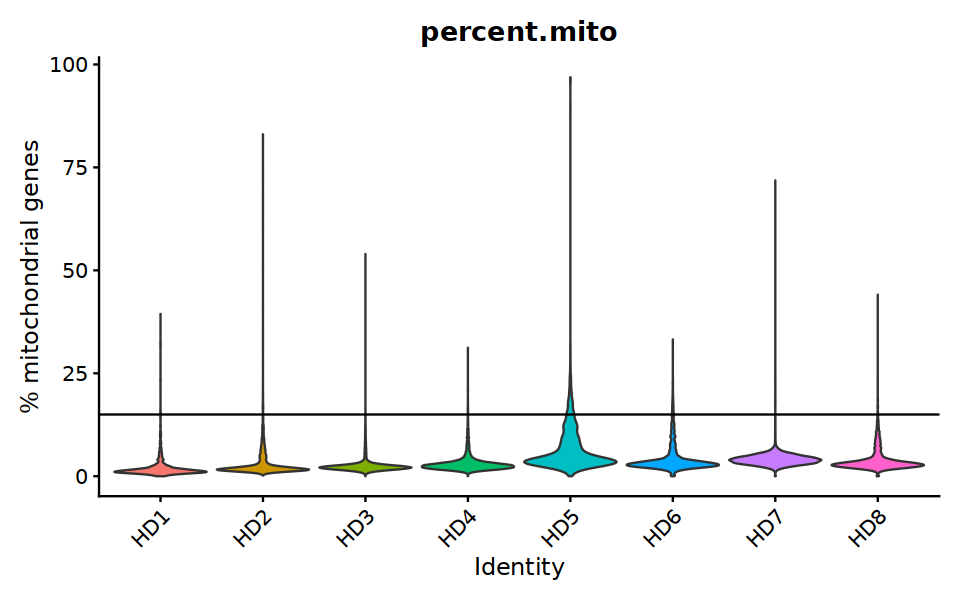

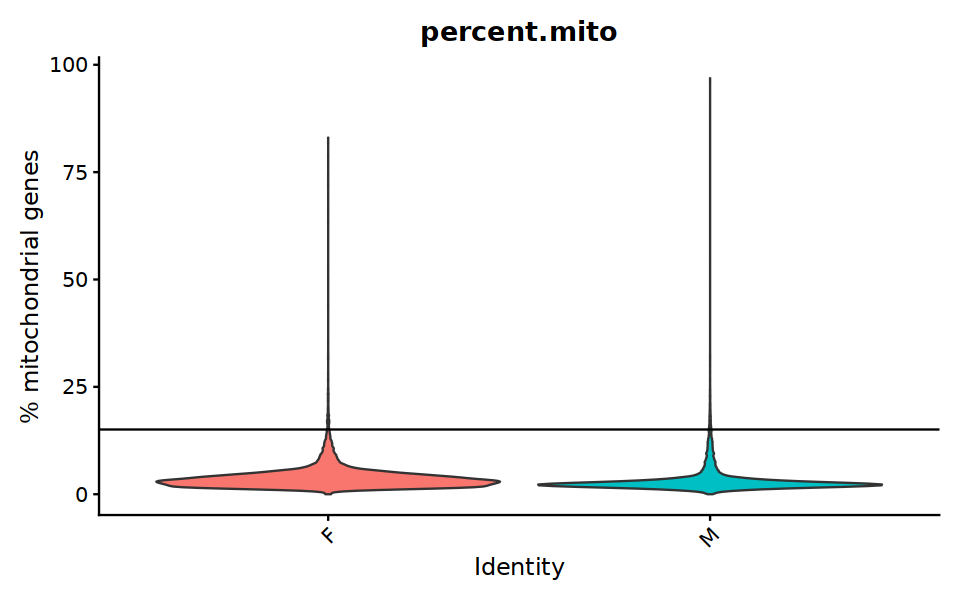

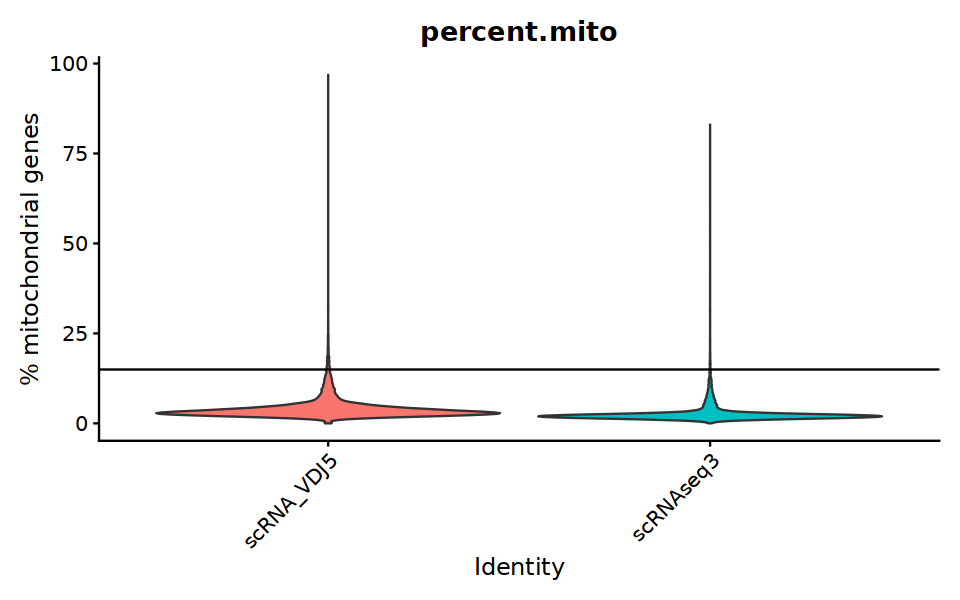

In [11]:
fig.size(5, 8)
#mito %
ctrl.bl[["percent.mito"]] <- PercentageFeatureSet(ctrl.bl, pattern = "^MT-")
VlnPlot(ctrl.bl, features = "percent.mito", pt.size = 0.0, group.by = "donorID") + theme(legend.position = "none") + 
ylab("% mitochondrial genes") + geom_hline(yintercept=15)
VlnPlot(ctrl.bl, features = "percent.mito", pt.size = 0.0, group.by = "sex") + theme(legend.position = "none") + 
ylab("% mitochondrial genes") + geom_hline(yintercept=15)
VlnPlot(ctrl.bl, features = "percent.mito", pt.size = 0.0, group.by = "sequencing.technology") + theme(legend.position = "none") + 
ylab("% mitochondrial genes") + geom_hline(yintercept=15)

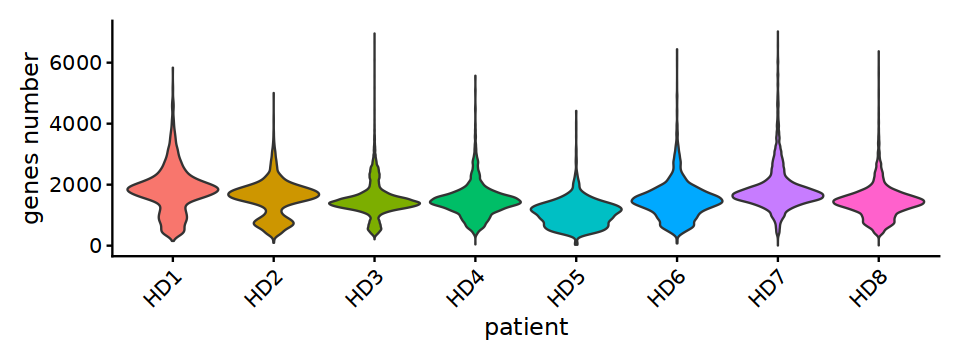

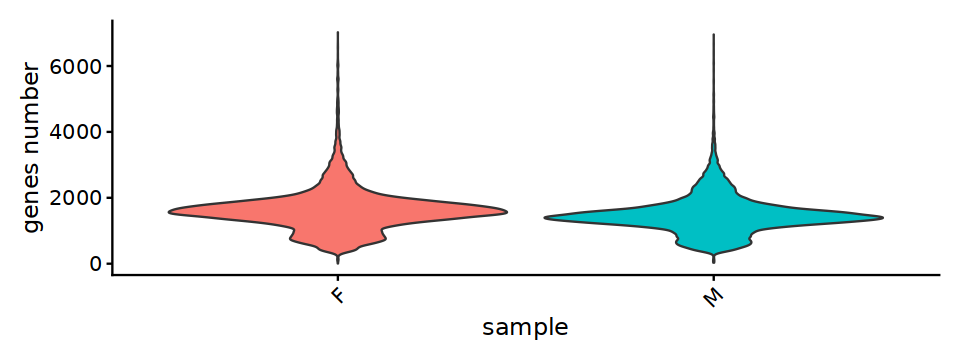

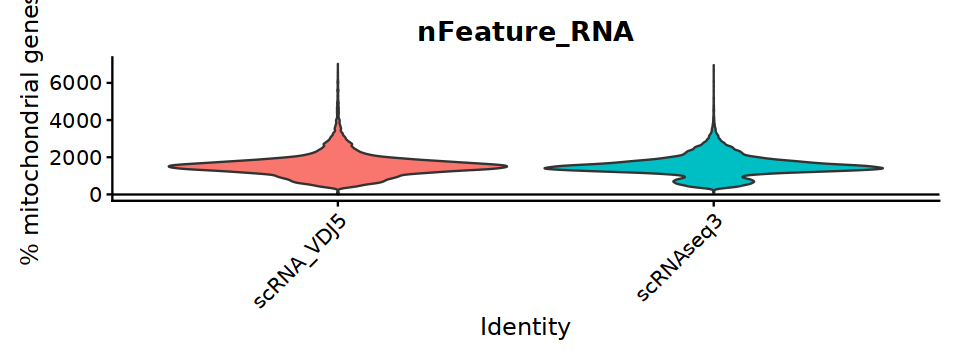

In [12]:
#genes num
fig.size(3, 8)
VlnPlot(ctrl.bl, features = "nFeature_RNA", pt.size = 0.0, group.by = "donorID") + theme(legend.position = "none") + ggtitle(NULL) +
  xlab("patient") + ylab("genes number") 
VlnPlot(ctrl.bl, features = "nFeature_RNA", pt.size = 0.0, group.by = "sex") + theme(legend.position = "none") + ggtitle(NULL) +
  xlab("sample") + ylab("genes number") 
VlnPlot(ctrl.bl, features = "nFeature_RNA", pt.size = 0.0, group.by = "sequencing.technology") + theme(legend.position = "none") + 
ylab("% mitochondrial genes") + geom_hline(yintercept=15)

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“The following aesthetics were dropped during statistical transformation: colour
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?”


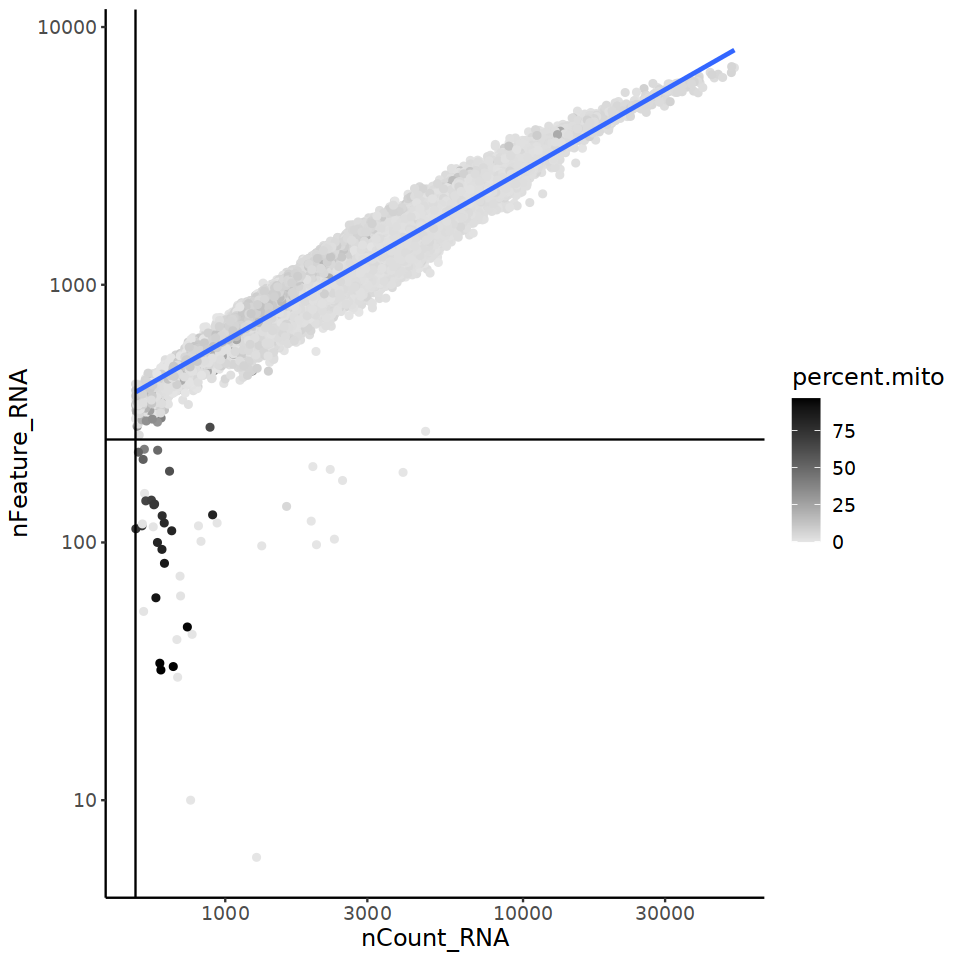

In [13]:
fig.size(8,8)
ctrl.bl@meta.data %>% 
  	ggplot(aes(x=nCount_RNA, y=nFeature_RNA, color=percent.mito)) + 
  	geom_point() + 
	scale_colour_gradient(low = "gray90", high = "black") +
  	stat_smooth(method=lm) +
  	scale_x_log10() + 
  	scale_y_log10() + 
  	theme_classic() +
  	geom_vline(xintercept = 500) +
  	geom_hline(yintercept = 250) +
    theme(text = element_text(size = 14)) 

In [14]:
#subset
ctrl.bl <- subset(ctrl.bl, subset = nCount_RNA > 500 & nFeature_RNA > 250 & percent.mito < 20) 

In [15]:
ctrl.bl

An object of class Seurat 
36601 features across 61799 samples within 1 assay 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data

In [1]:
1

[1] 1

## Preprocessing

In [16]:
ctrl.bl <- NormalizeData(ctrl.bl, normalization.method = "LogNormalize", scale.factor = 10000) %>% 
            FindVariableFeatures(selection.method = "vst", nfeatures = 2000) %>% 
            ScaleData() %>% 
            RunPCA(verbose = F)

Centering and scaling data matrix



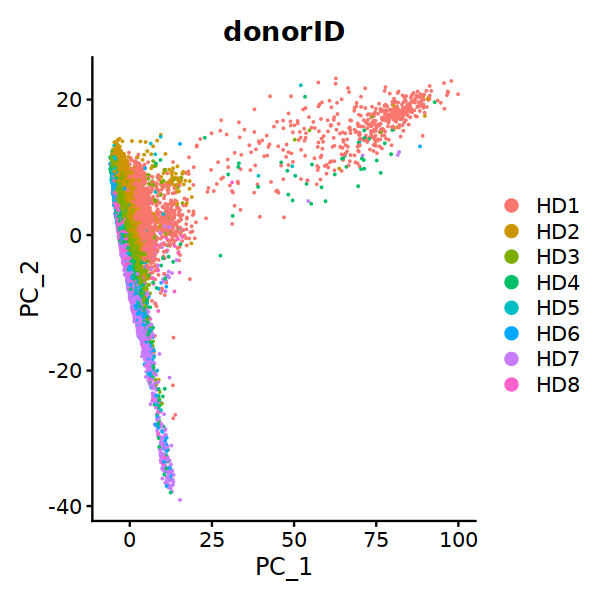

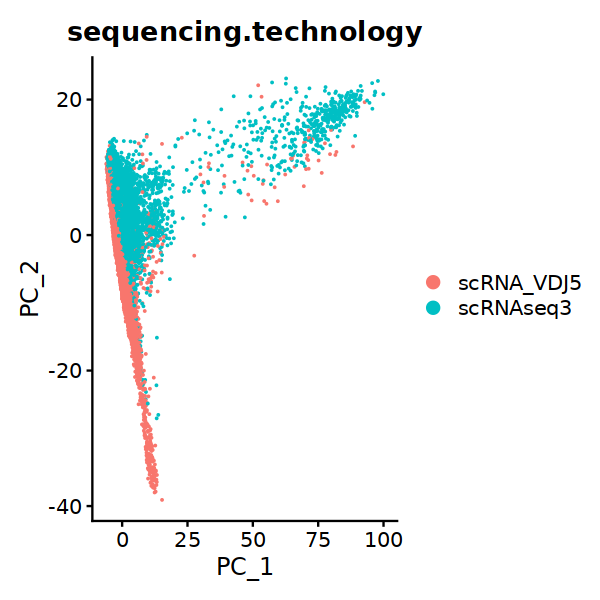

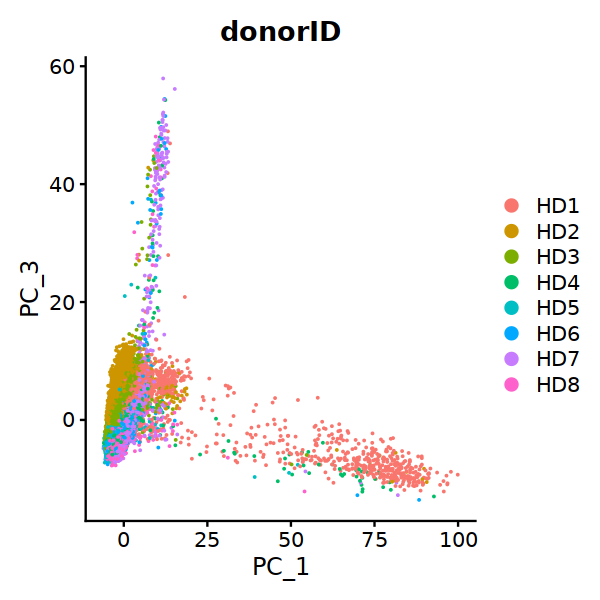

In [17]:
fig.size(5,5)
DimPlot(ctrl.bl, reduction = "pca", dims = 1:2, group.by = "donorID", shuffle = T)
DimPlot(ctrl.bl, reduction = "pca", dims = 1:2, group.by = "sequencing.technology", shuffle = T)
DimPlot(ctrl.bl, reduction = "pca", dims = c(1,3), group.by = "donorID", shuffle = T)

Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10



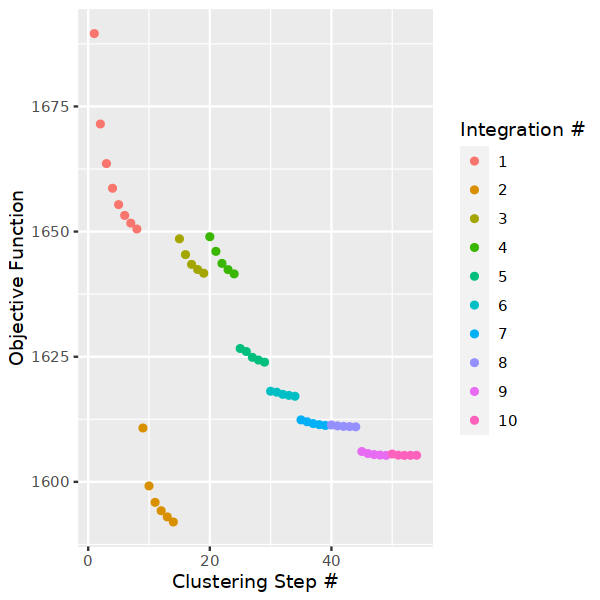

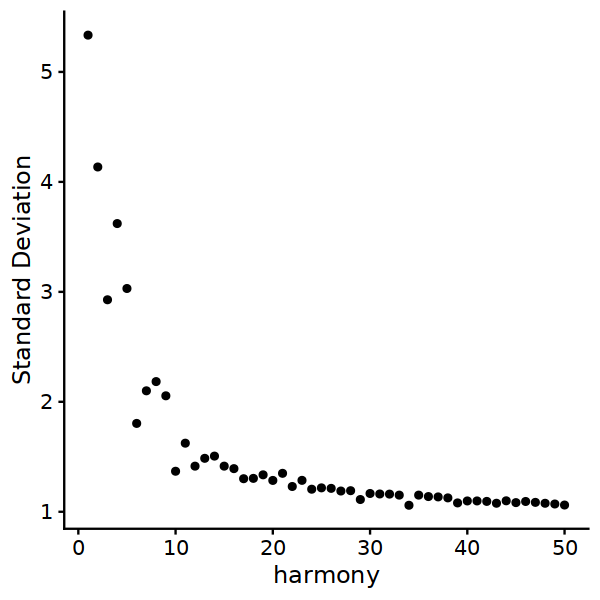

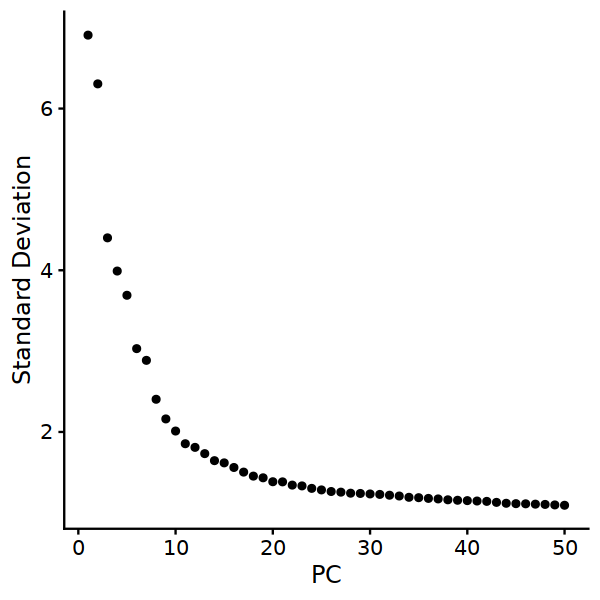

In [18]:
fig.size(5,5)
ctrl.bl <- RunHarmony(ctrl.bl, group.by.vars=c("donorID","sequencing.technology"), reduction.use = "pca",#, theta = c(2, 3),
                 plot_convergence = TRUE, max_iter = 10, 
                 early_stop = F) #, .options = harmony_options(max.iter.cluster = 30)) 



ElbowPlot(ctrl.bl, ndims = 50, reduction = "harmony") 
ElbowPlot(ctrl.bl, ndims = 50, reduction = "pca") 

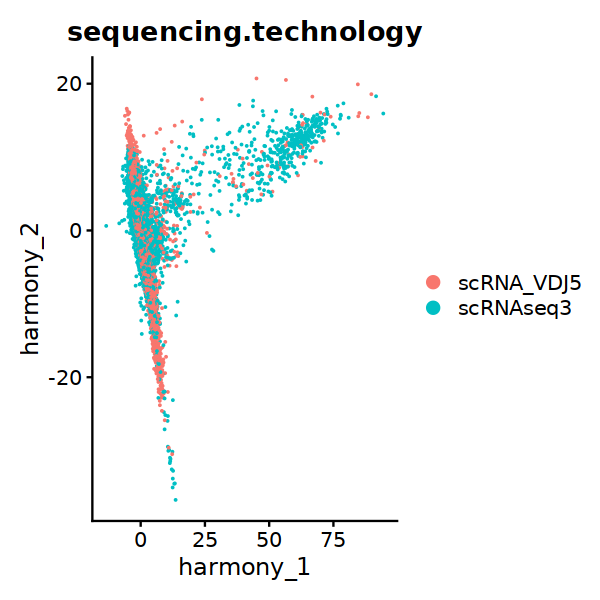

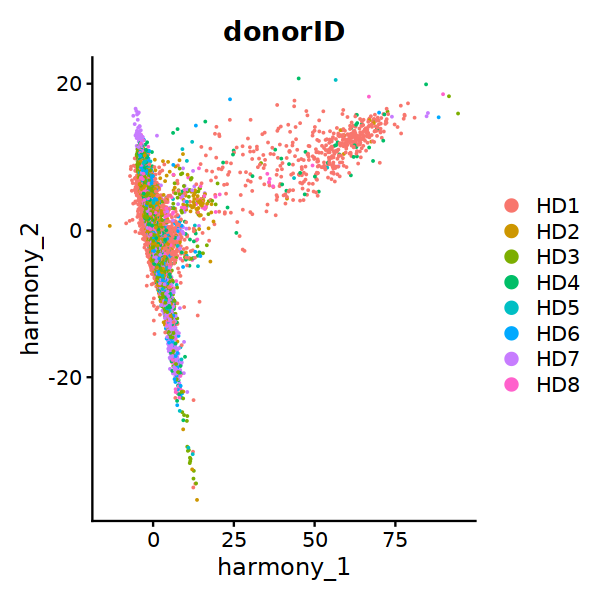

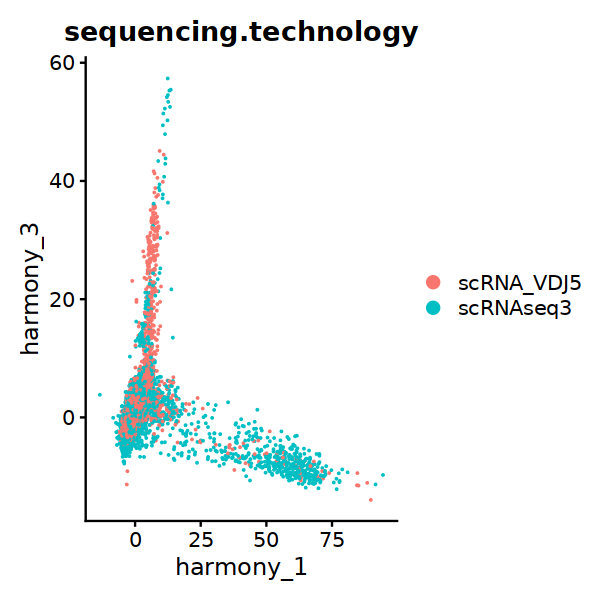

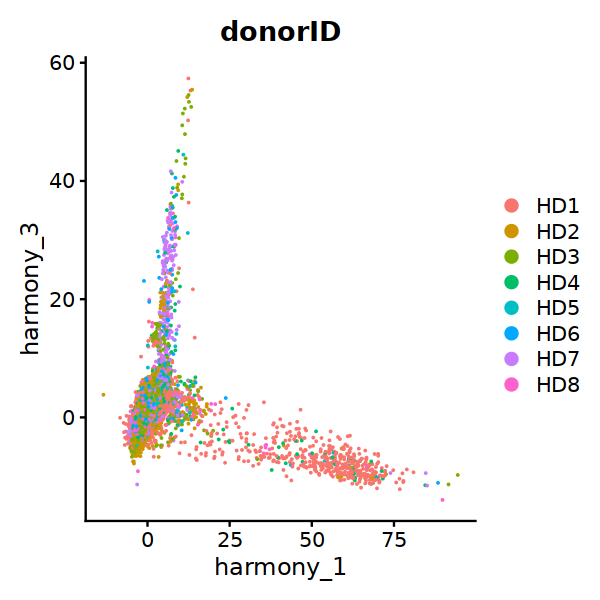

In [19]:
fig.size(5,5)
DimPlot(ctrl.bl, reduction = "harmony", dims = 1:2, group.by = "sequencing.technology", shuffle = T)
DimPlot(ctrl.bl, reduction = "harmony", dims = 1:2, group.by = "donorID", shuffle = T)
DimPlot(ctrl.bl, reduction = "harmony", dims = c(1,3), group.by = "sequencing.technology", shuffle = T)
DimPlot(ctrl.bl, reduction = "harmony", dims = c(1,3), group.by = "donorID", shuffle = T)

In [20]:
set.seed(1)
HU <- uwot::umap(ctrl.bl@reductions$harmony@cell.embeddings, min_dist = 0.3, 
                 spread = 0.8, ret_extra = 'fgraph', fast_sgd = FALSE)
colnames(HU$embedding) = c('HUMAP1', 'HUMAP2')
rownames(HU$fgraph) = colnames(HU$fgraph) = Cells(ctrl.bl)
ctrl.bl[['humap']] <- Seurat::CreateDimReducObject(
    embeddings = HU$embedding,
    assay = 'RNA',
    key = 'HUMAP_',
    global = TRUE
)
HU_graph <- Seurat::as.Graph(HU$fgraph)
DefaultAssay(HU_graph) <- DefaultAssay(ctrl.bl)
ctrl.bl[['humap_fgraph']] <- HU_graph

ctrl.bl <- FindClusters(ctrl.bl, graph.name = 'humap_fgraph', resolution = 1, verbose = TRUE)

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 61799
Number of edges: 758252

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7235
Number of communities: 21
Elapsed time: 17 seconds


Warning message:
“ggrepel: 14 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


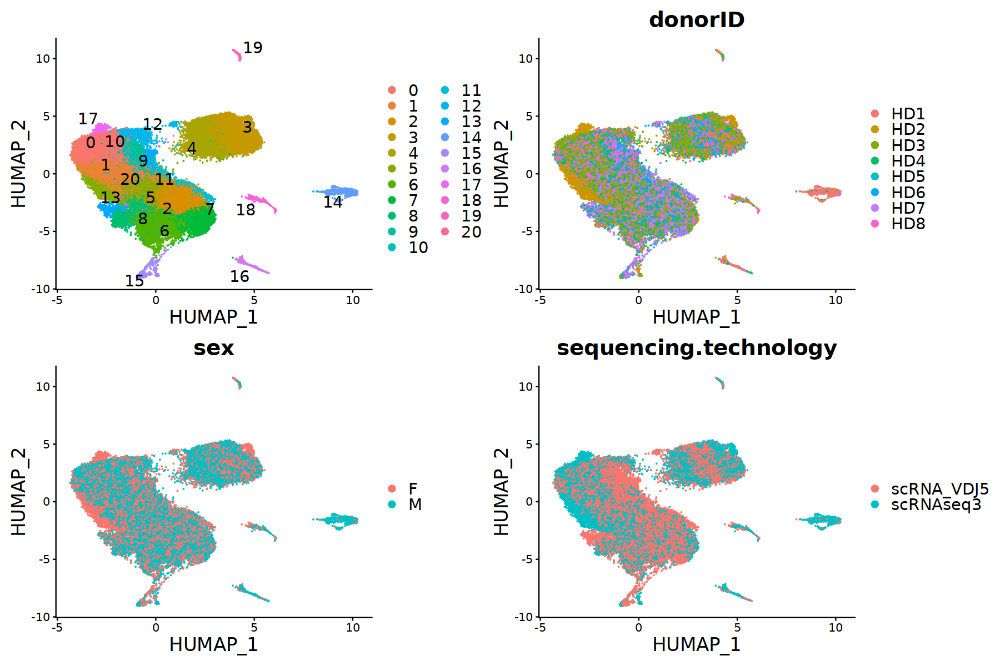

In [21]:
fig.size(10, 15)

# clustercols <- c(colorRampPalette(brewer.pal(8, "Set2"))(13)[1:10], colorRampPalette(brewer.pal(8, "Set1"))(13)[1:9], colorRampPalette(brewer.pal(8, "Set3"))(13)[1:9])

p1 <- DimPlot(ctrl.bl, label = T, repel = T, shuffle = T,  label.size = 6) + theme(text = element_text(size = 20))
p2 <- DimPlot(ctrl.bl, group.by = "donorID", label = F, repel = T, shuffle = T, label.size = 6) + theme(text = element_text(size = 20))
p3 <- DimPlot(ctrl.bl, group.by = "sex", label = F, repel = T, shuffle = T, label.size = 6) + theme(text = element_text(size = 20))
p4 <- DimPlot(ctrl.bl, group.by = "sequencing.technology", label = F, repel = T, shuffle = T, label.size = 6) + theme(text = element_text(size = 20))

p1+p2+p3 +p4+ plot_layout(ncol = 2)

# Moving forward with donors 4-8 (3' single cell RNA seq)
for technology consistency (enough cells in total)

In [56]:
Idents(ctrl.bl) <- "donorID"
ctrl.sub <- subset(ctrl.bl, idents = c("HD4","HD5", "HD6", "HD7", "HD8"))

## Find Doublets

In [23]:
sce <- as.SingleCellExperiment(ctrl.sub)
bp <- MulticoreParam(3, RNGseed=1234)
sce <- scDblFinder(sce, clusters="seurat_clusters", samples = "donorID", BPPARAM=bp)

R_zmq_msg_send errno: 4 strerror: Interrupted system call


R_zmq_msg_send errno: 4 strerror: Interrupted system call


R_zmq_msg_send errno: 4 strerror: Interrupted system call




In [24]:
a <- table(sce$scDblFinder.class)
a
a[2]/(a[1]+a[2])


singlet doublet 
  31474    2746 

doublet 
0.08024547

Picking joint bandwidth of 0.0203

Picking joint bandwidth of 0.0247



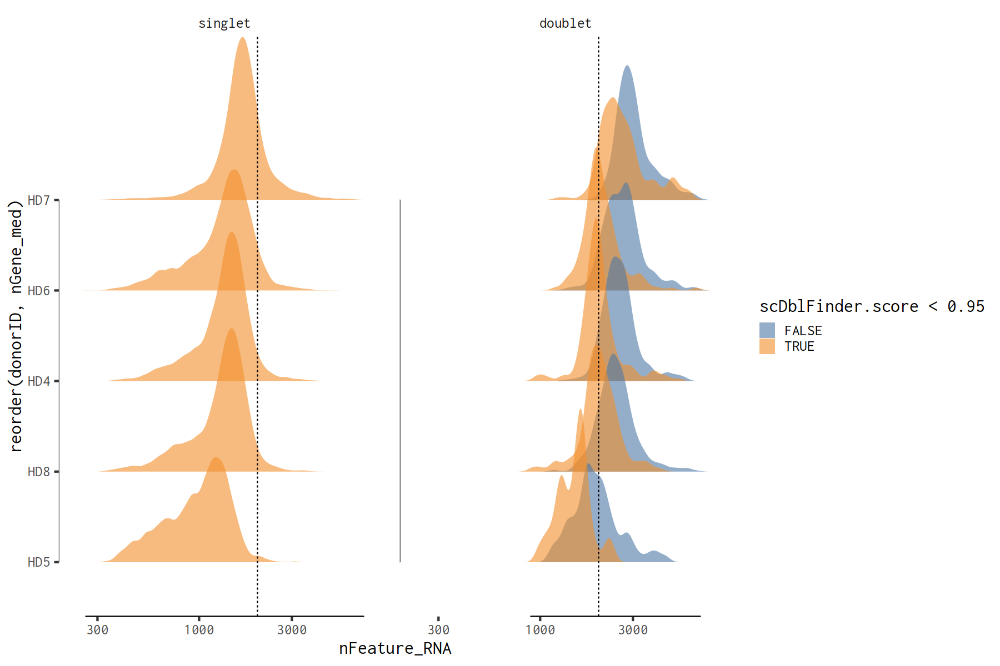

In [25]:
data.frame(sce@colData) %>% filter(!is.na(scDblFinder.class)) %>% group_by(donorID,) %>% 
mutate(nGene_med = median(nFeature_RNA)) %>% 
    ggplot(aes(nFeature_RNA, reorder(donorID, nGene_med), fill = scDblFinder.score<0.95)) + 
        geom_density_ridges2(alpha = .6, color = NA) + 
        theme_tufte(base_size = 20) + geom_rangeframe(color = 'black') + 
        scale_x_continuous(trans = 'log10') + geom_vline(xintercept = 2000, linetype =2) +
        scale_fill_tableau() +  facet_wrap(~scDblFinder.class, ncol = 2) + 

        NULL

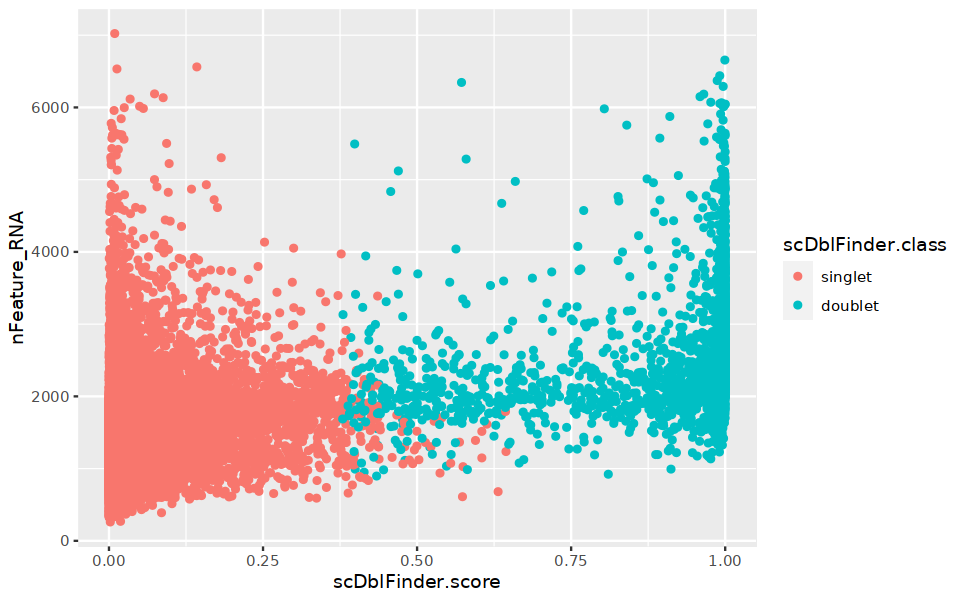

In [26]:
fig.size(5,8)
sce@colData %>% data.frame %>% ggplot(aes(x=scDblFinder.score, y=nFeature_RNA, color=scDblFinder.class)) + geom_point()

In [57]:
ctrl.sub$scDblFinder.class <- sce$scDblFinder.class
ctrl.sub$scDblFinder.score <- sce$scDblFinder.score

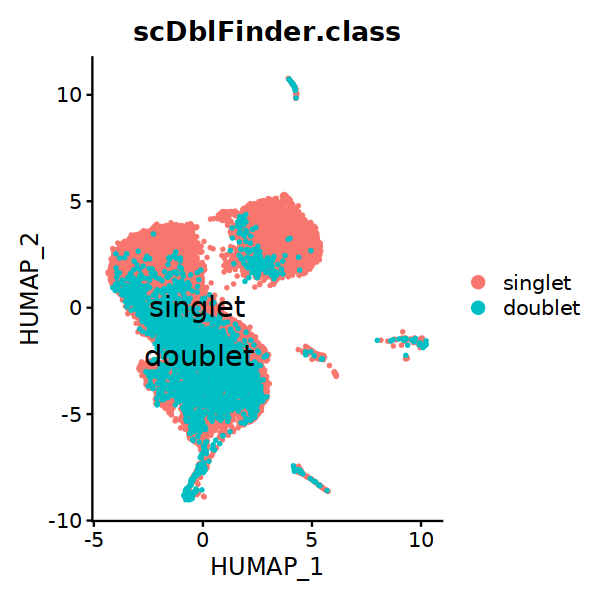

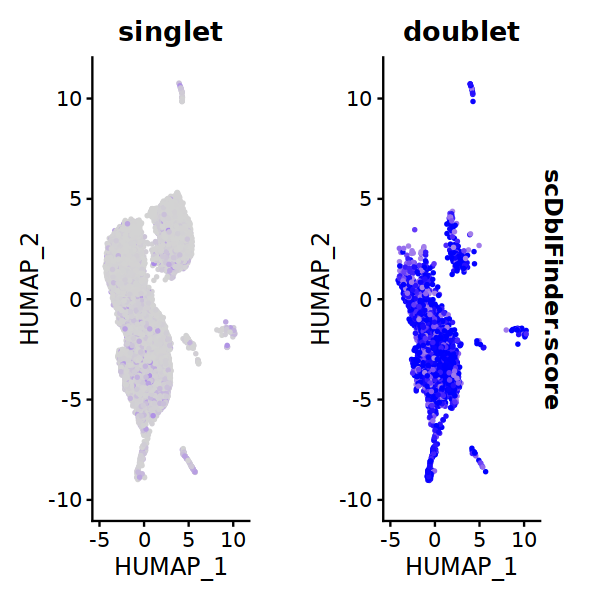

In [58]:
fig.size(5,5)
DimPlot(ctrl.sub, label = T, pt.size = 0.5, label.size = 6, order =  c("doublet", "singlet"), group.by = "scDblFinder.class") 
FeaturePlot(ctrl.sub, pt.size = 0.5, label.size = 6, repel = T, split.by = "scDblFinder.class", features = "scDblFinder.score") 

### remove doublets

In [59]:
ctrl.sub <- subset(ctrl.sub, subset = scDblFinder.class == "singlet")

In [60]:
ctrl.sub

An object of class Seurat 
36601 features across 31474 samples within 1 assay 
Active assay: RNA (36601 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 3 dimensional reductions calculated: pca, harmony, humap

## Redo preproccessing

In [61]:
ctrl.sub <- NormalizeData(ctrl.sub, normalization.method = "LogNormalize", scale.factor = 10000) %>% 
            FindVariableFeatures(selection.method = "vst", nfeatures = 2000) %>% 
            ScaleData() %>% 
            RunPCA(verbose = F)

Centering and scaling data matrix



Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10



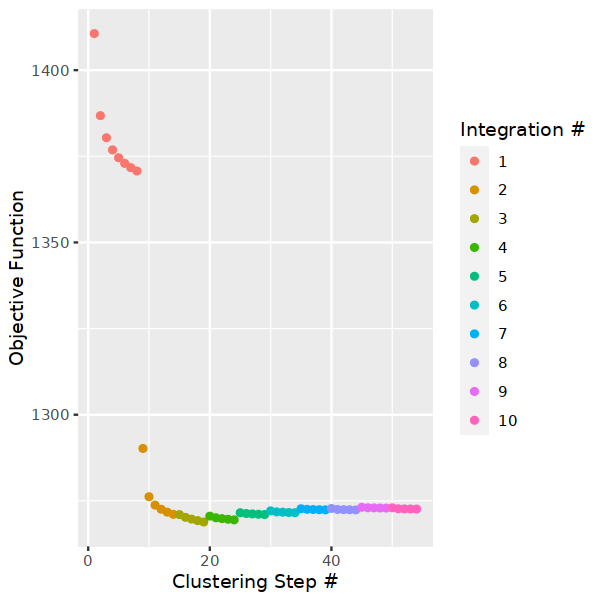

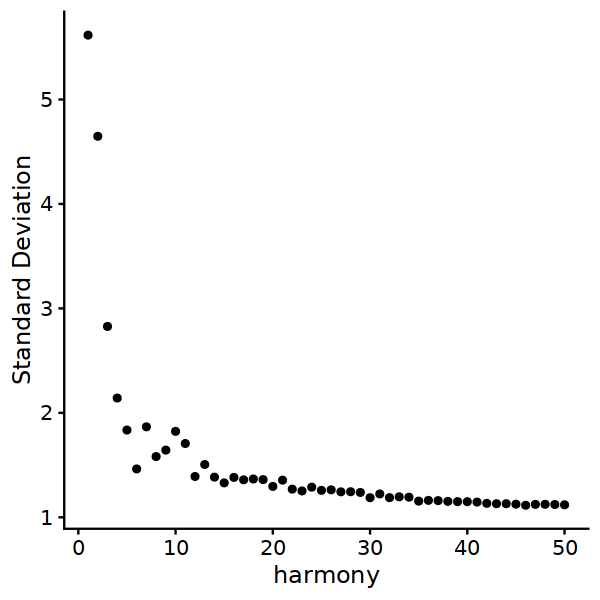

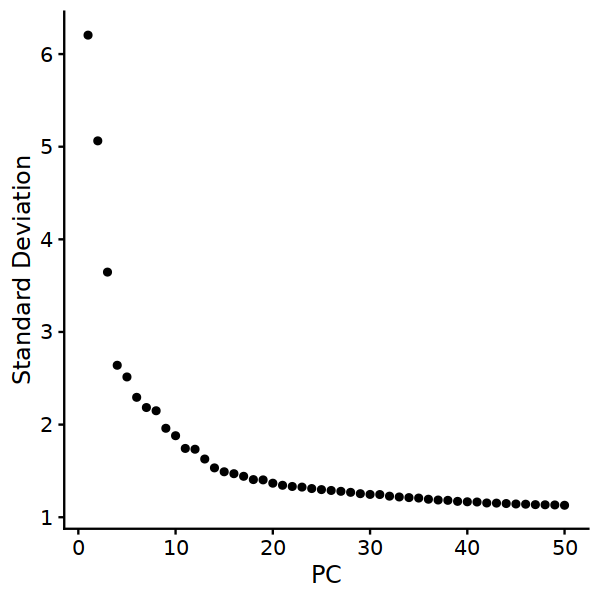

In [62]:
fig.size(5,5)
ctrl.sub <- RunHarmony(ctrl.sub, group.by.vars="donorID", reduction.use = "pca", 
                 plot_convergence = TRUE, max_iter = 10, 
                 early_stop = F) 

ElbowPlot(ctrl.sub, ndims = 50, reduction = "harmony") 
ElbowPlot(ctrl.sub, ndims = 50, reduction = "pca") 

In [63]:
Run_uwot_umap <- function(SeuratObj, min_dist = 0.3, spread = 0.8 , seed =1){
    set.seed(1)
    HU <- uwot::umap(SeuratObj@reductions$harmony@cell.embeddings, min_dist = 0.3, 
                 spread = 0.8, ret_extra = 'fgraph', fast_sgd = FALSE)
    colnames(HU$embedding) = c('HUMAP1', 'HUMAP2')
    rownames(HU$fgraph) = colnames(HU$fgraph) = Cells(SeuratObj)
    SeuratObj[['humap']] <- Seurat::CreateDimReducObject(
        embeddings = HU$embedding,
        assay = 'RNA',
        key = 'HUMAP_',
        global = TRUE
    )
    HU_graph <- Seurat::as.Graph(HU$fgraph)
    DefaultAssay(HU_graph) <- DefaultAssay(SeuratObj)
    SeuratObj[['humap_fgraph']] <- HU_graph
    return(SeuratObj)
    }

ctrl.sub <- Run_uwot_umap(ctrl.sub)
ctrl.sub <- FindClusters(ctrl.sub, graph.name = 'humap_fgraph', resolution = 0.8, verbose = TRUE)

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 31474
Number of edges: 380700

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7407
Number of communities: 13
Elapsed time: 2 seconds


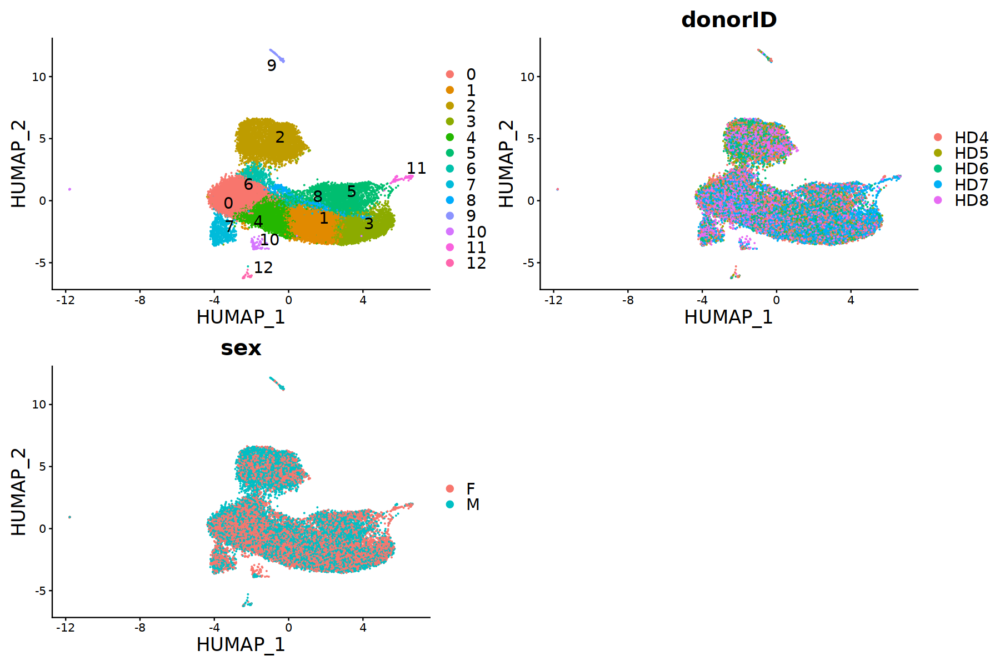

In [64]:
fig.size(10, 15)

p1 <- DimPlot(ctrl.sub, label = T, repel = T, shuffle = T,  label.size = 6) + theme(text = element_text(size = 20))
p2 <- DimPlot(ctrl.sub, group.by = "donorID", label = F, repel = T, shuffle = T, label.size = 6) + theme(text = element_text(size = 20))
p3 <- DimPlot(ctrl.sub, group.by = "sex", label = F, repel = T, shuffle = T, label.size = 6) + theme(text = element_text(size = 20))

p1+p2+p3 +plot_layout(ncol = 2)

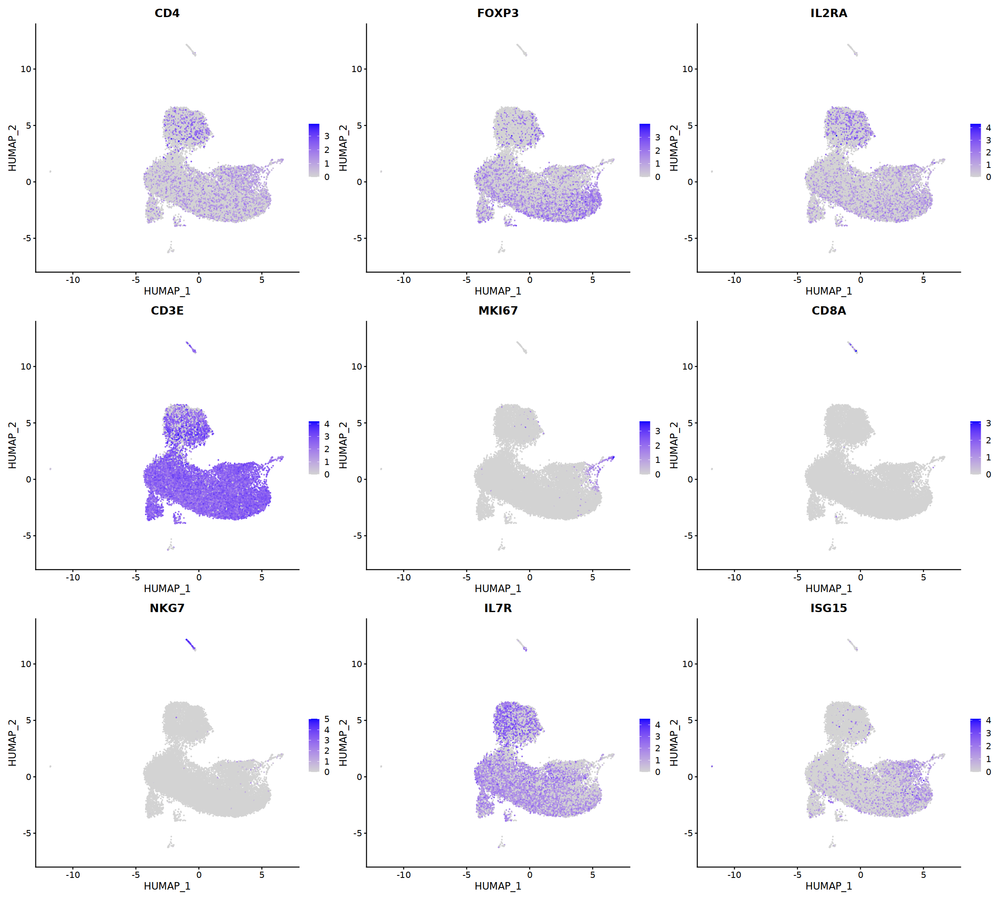

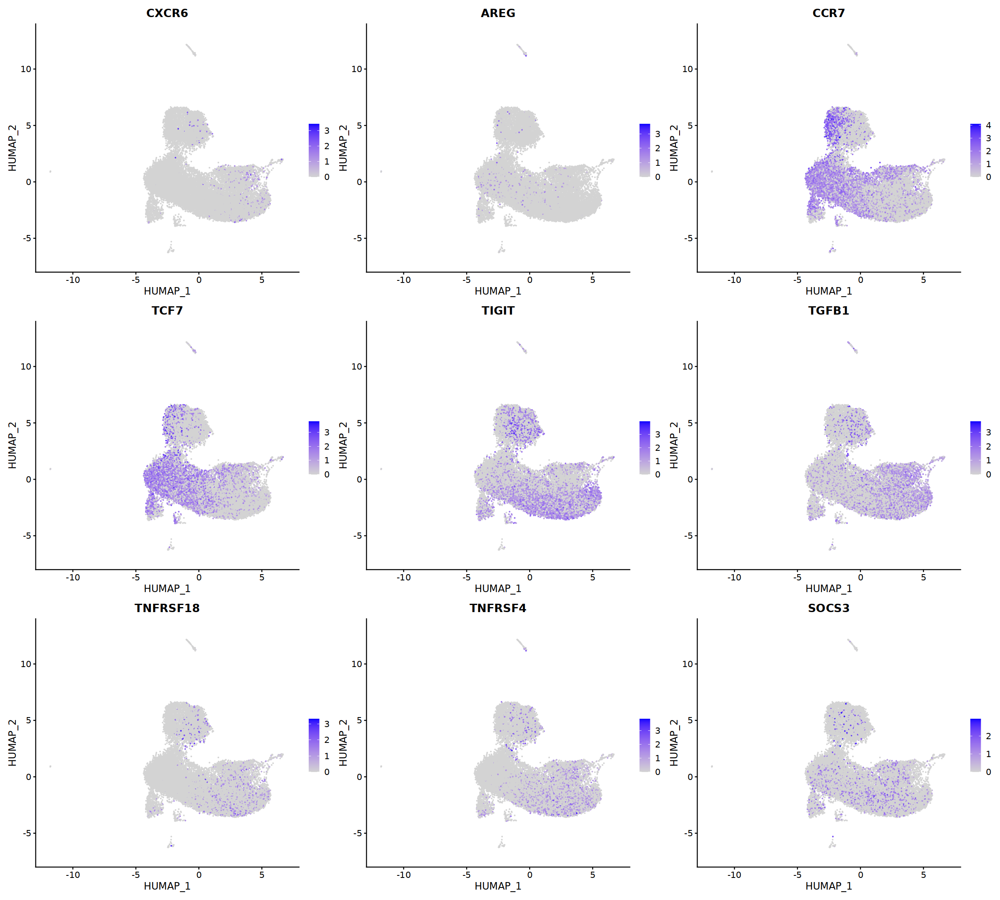

In [65]:
fig.size(18, 20)
FeaturePlot(ctrl.sub, c("CD4", "FOXP3", "IL2RA", "CD3E", "MKI67", "CD8A", "NKG7", "IL7R", "ISG15"))
fig.size(18, 20)
FeaturePlot(ctrl.sub, c("CXCR6", "AREG", "CCR7", "TCF7", "TIGIT", "TGFB1", "TNFRSF18", "TNFRSF4", "SOCS3"))

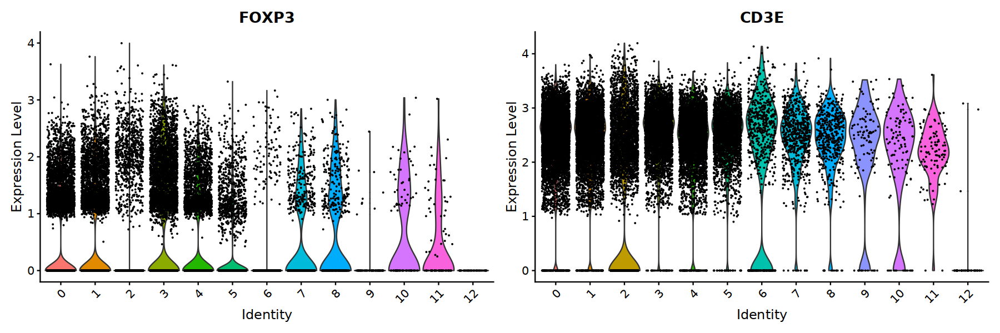

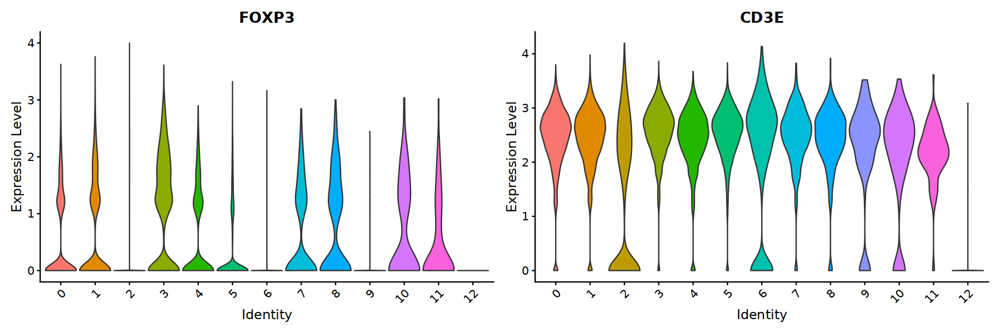

In [67]:
fig.size(5, 15)
VlnPlot(ctrl.sub, c("FOXP3", "CD3E"))
VlnPlot(ctrl.sub, c("FOXP3", "CD3E"), pt.size = 0)

`summarise()` has grouped output by 'seurat_clusters'. You can override using
the `.groups` argument.


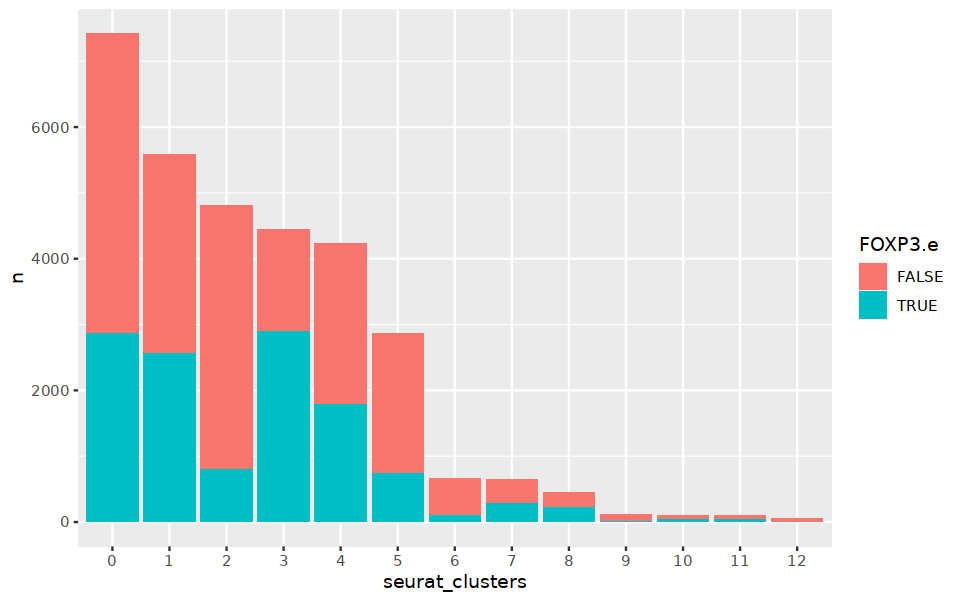

In [68]:
fig.size(5,8)
#number of cells per cluster
p.cells.foxp3 <- FetchData(ctrl.sub, vars= c("FOXP3", "seurat_clusters"), assay="RNA", slot = "data")
p.cells.foxp3 <- p.cells.foxp3%>% mutate(FOXP3.e = FOXP3 > 0)%>% group_by(seurat_clusters, FOXP3.e)%>% summarise(n = n())%>% ungroup()
ggplot(p.cells.foxp3, aes(x=seurat_clusters, y=n, fill = FOXP3.e)) + geom_bar(stat = "identity") 

In [69]:
fig.size(5,8)
#number of cells per cluster
p.cells.foxp3 <- FetchData(ctrl.sub, vars= c("FOXP3"), assay="RNA", slot = "data")
p.cells.foxp3 <- p.cells.foxp3%>% mutate(FOXP3.e = FOXP3 > 0)%>% group_by(FOXP3.e)%>% summarise(n = n())%>% ungroup()
p.cells.foxp3

FOXP3.e,n
<lgl>,<int>
FALSE,19148
TRUE,12326


In [70]:
table(ctrl.sub$donorID)
table(ctrl.sub$donorID, ctrl.sub$seurat_clusters)


 HD4  HD5  HD6  HD7  HD8 
6404 1965 5807 9226 8072 

     
         0    1    2    3    4    5    6    7    8    9   10   11   12
  HD4 1396 1185  812  850  862  894  135  106   58   44   20   15   27
  HD5  270  328  684  218  195  163   32   34   22    6    1    4    8
  HD6 1118  981 1247  781  705  592  142  112   75   33   10    7    4
  HD7 2007 2201  431 1923 1116  862  141  214  217   16   29   62    7
  HD8 2630  883 1628  667 1357  349  214  186   83    8   44   15    8

## Cluster markers

In [71]:
clust.markers <- wilcoxauc(ctrl.sub, "seurat_clusters")

In [72]:
clust.markers %>%
    group_by(group) %>% filter(padj <0.05 & auc > 0.6) %>% 
    slice_max(n = 30, order_by = logFC) %>% 
    select(feature, group) %>% 
    mutate(row = row_number()) %>% 
    tidyr::pivot_wider(names_from = group, values_from = feature)

row,0,1,10,11,12,2,3,4,5,6,7,8,9
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,EEF1B2,S100A4,PPBP,TUBA1B,HLA-DRA,ARHGAP15,CD74,EEF1B2,CRIP1,RPS8,TRBV7-6,TRBV30,CCL5
2,RPS12,IL32,CAVIN2,HIST1H4C,CD74,SKAP1,S100A4,RPS12,AQP3,RPL30,TRBV7-5,EPHB6,NKG7
3,RPS13,SH3BGRL3,NRGN,STMN1,LYZ,MALAT1,IL32,RPL32,S100A11,RPS12,TRBV7-4,FTL,GZMA
4,RPS5,CRIP1,CCL5,TUBB,S100A8,SMCHD1,HLA-DRB1,RPS5,S100A4,RPL11,RPS3,NA,GNLY
5,RPL32,S100A10,PF4,RRM2,S100A9,PTPRC,CRIP1,RPS6,ANXA1,RPS27A,RPL5,NA,ANXA1
6,RPS14,VIM,TUBB1,HMGB2,IFI30,FOXP1,HLA-DRB5,RPS4X,SH3BGRL3,RPL5,RPL8,NA,CST7
7,GAS5,GAPDH,SPARC,H2AFZ,HLA-DRB1,PDE3B,SH3BGRL3,RPL39,COTL1,RPL10,RPS27A,NA,PRF1
8,RPL35A,S100A6,GNG11,GAPDH,CST3,MBNL1,HLA-DPB1,RPL12,ACTG1,RPS13,RPL18A,NA,HOPX
9,RPS23,PFN1,TAGLN2,MKI67,TYROBP,ZBTB20,HLA-DPA1,RPS18,CNN2,RPL12,EEF1A1,NA,CTSW


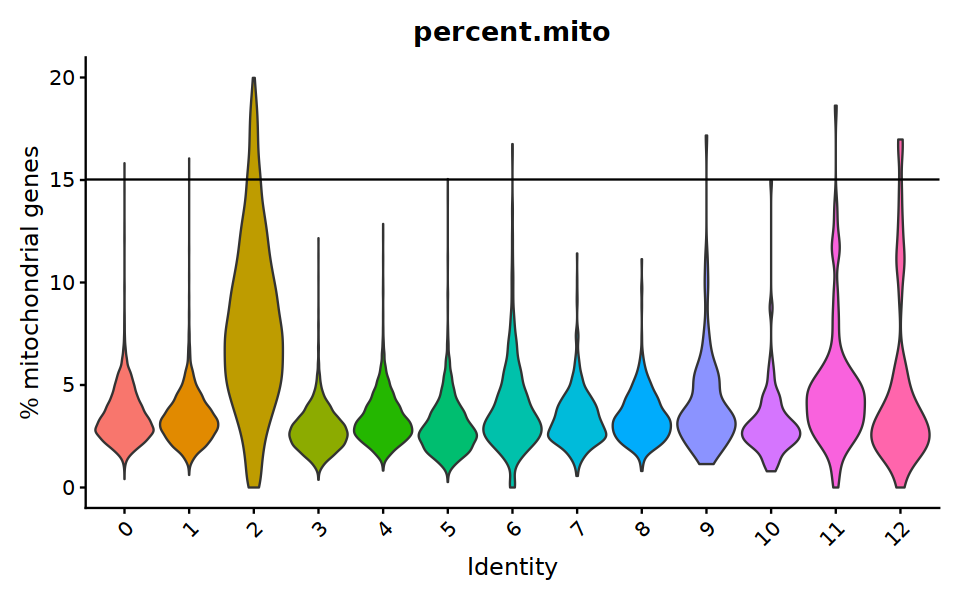

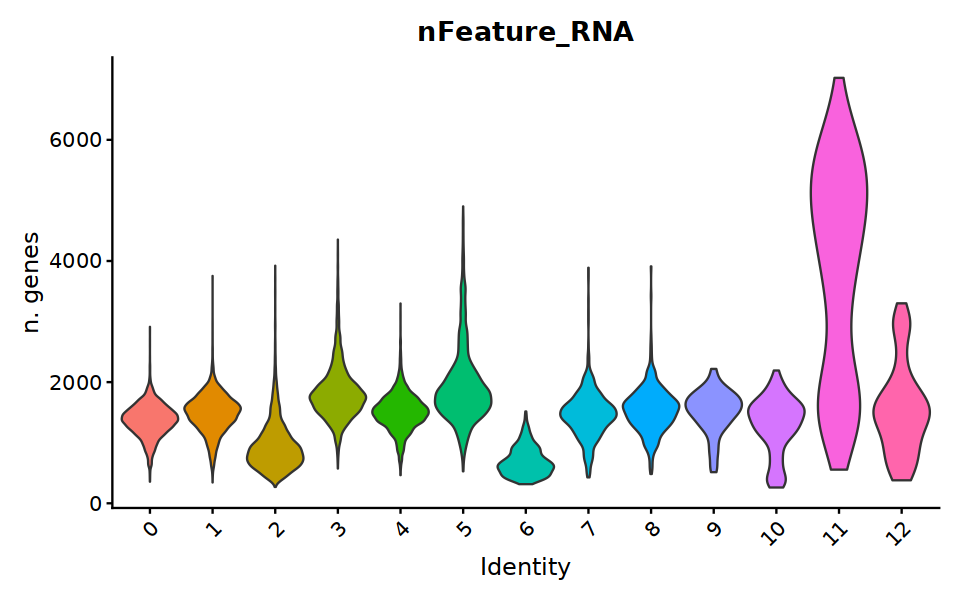

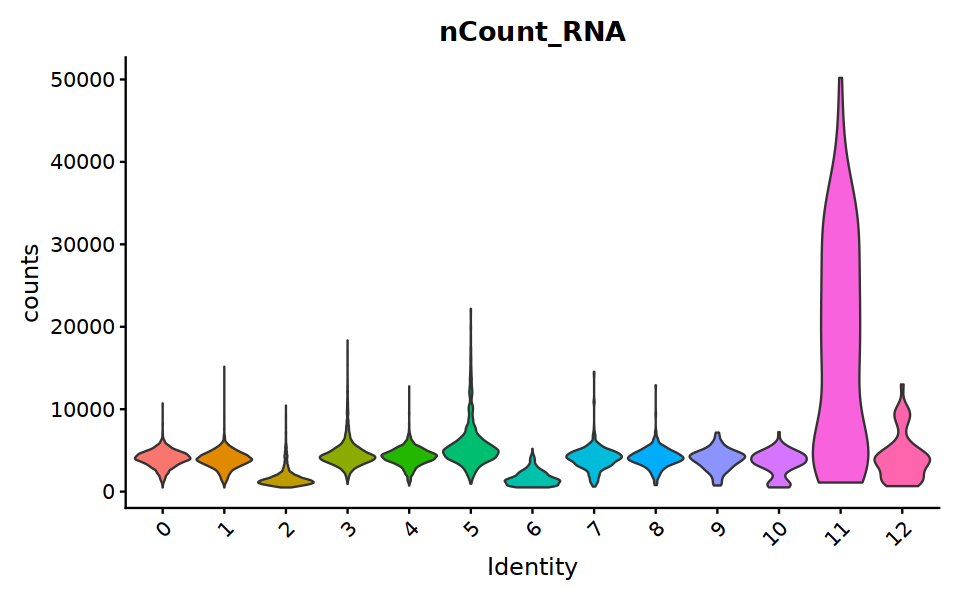

In [73]:
fig.size(5, 8)
#mito %
ctrl.sub[["percent.mito"]] <- PercentageFeatureSet(ctrl.sub, pattern = "^MT-")
VlnPlot(ctrl.sub, features = "percent.mito", pt.size = 0.0, group.by = "seurat_clusters") + theme(legend.position = "none") + 
ylab("% mitochondrial genes") + geom_hline(yintercept=15)
#genes
VlnPlot(ctrl.sub, features = "nFeature_RNA", pt.size = 0.0, group.by = "seurat_clusters") + theme(legend.position = "none") + 
ylab("n. genes") 
#countns
VlnPlot(ctrl.sub, features = "nCount_RNA", pt.size = 0.0, group.by = "seurat_clusters") + theme(legend.position = "none") + 
ylab("counts") 

## Removing non FOXP3 clusters

In [74]:
# cluster 6, 9, 12 - non foxp3
# cluster 2 - high mitochondria, low FOXP3

Idents(ctrl.sub) <- "seurat_clusters"
ctrl.sub <- subset(ctrl.sub, idents = c(2,6,9,12), invert =T)

In [75]:
ctrl.sub

An object of class Seurat 
36601 features across 25847 samples within 1 assay 
Active assay: RNA (36601 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 3 dimensional reductions calculated: pca, harmony, humap

## Redo Preprocessing

In [76]:
ctrl.sub <- NormalizeData(ctrl.sub, normalization.method = "LogNormalize", scale.factor = 10000) %>% 
            FindVariableFeatures(selection.method = "vst", nfeatures = 2000) %>% 
            ScaleData() %>% 
            RunPCA(verbose = F)

Centering and scaling data matrix



Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10



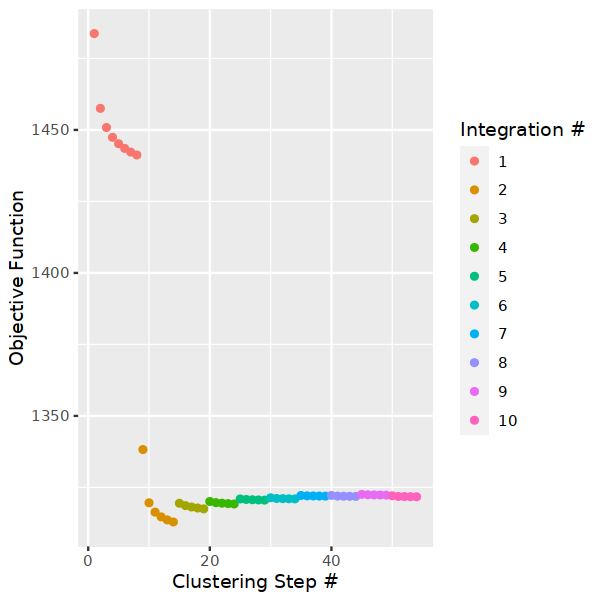

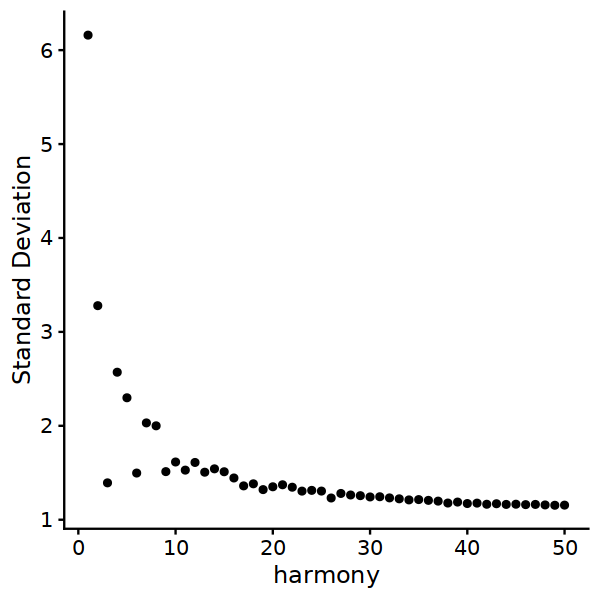

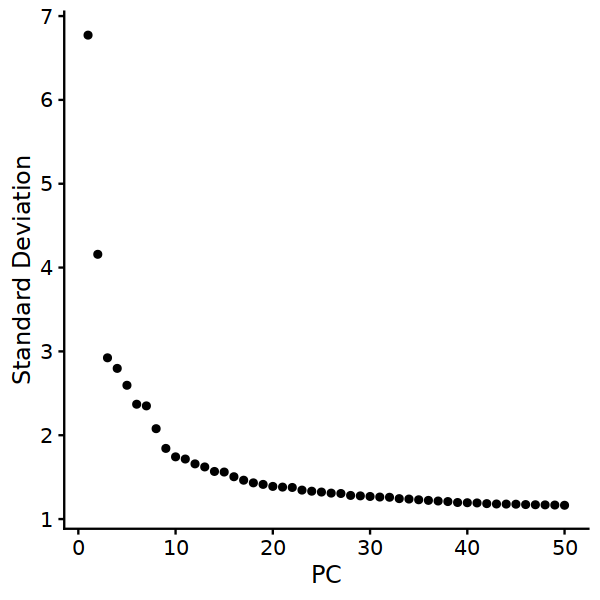

In [78]:
fig.size(5,5)
ctrl.sub <- RunHarmony(ctrl.sub, group.by.vars="donorID", reduction.use = "pca",
                 plot_convergence = TRUE, max_iter = 10, 
                 early_stop = F) 

ElbowPlot(ctrl.sub, ndims = 50, reduction = "harmony") 
ElbowPlot(ctrl.sub, ndims = 50, reduction = "pca") 

In [87]:
ctrl.sub <- Run_uwot_umap(ctrl.sub)
ctrl.sub <- FindClusters(ctrl.sub, graph.name = 'humap_fgraph', resolution = 0.5, verbose = TRUE)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 25847
Number of edges: 314305

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7717
Number of communities: 8
Elapsed time: 1 seconds


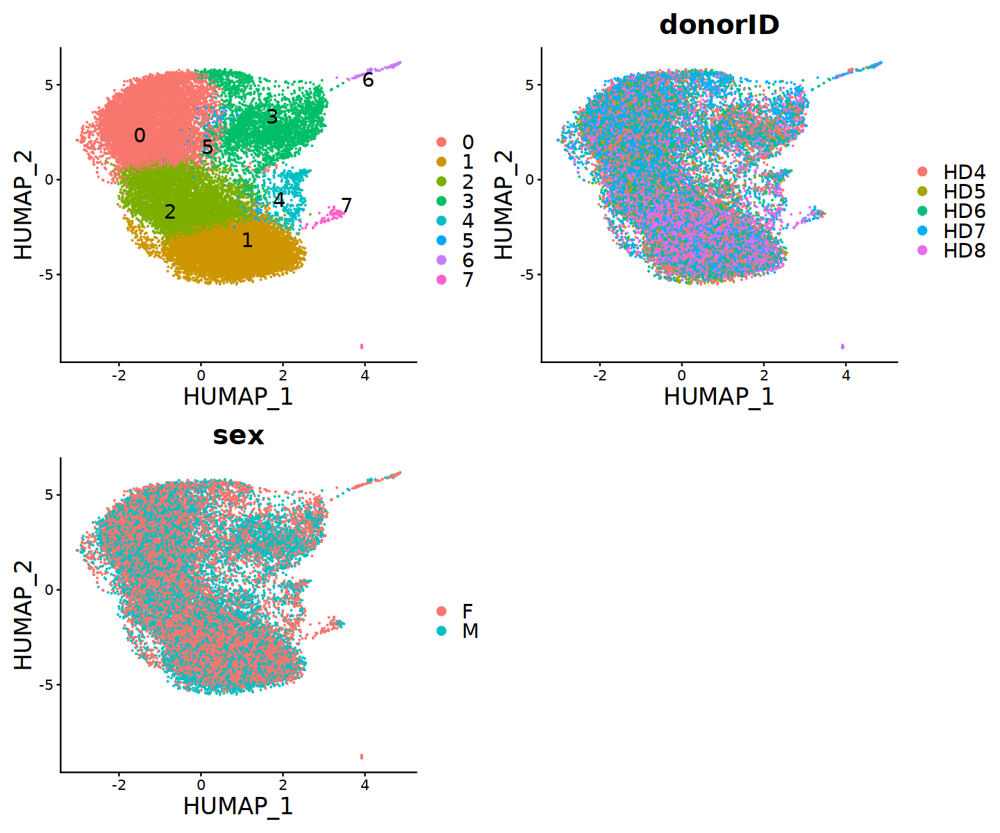

In [88]:
fig.size(10, 12)

# clustercols <- c(colorRampPalette(brewer.pal(8, "Set2"))(13)[1:10], colorRampPalette(brewer.pal(8, "Set1"))(13)[1:9], colorRampPalette(brewer.pal(8, "Set3"))(13)[1:9])

p1 <- DimPlot(ctrl.sub, label = T, repel = T, shuffle = T,  label.size = 6) + theme(text = element_text(size = 20))
p2 <- DimPlot(ctrl.sub, group.by = "donorID", label = F, repel = T, shuffle = T, label.size = 6) + theme(text = element_text(size = 20))
p3 <- DimPlot(ctrl.sub, group.by = "sex", label = F, repel = T, shuffle = T, label.size = 6) + theme(text = element_text(size = 20))


p1+p2+p3 +plot_layout(ncol = 2)

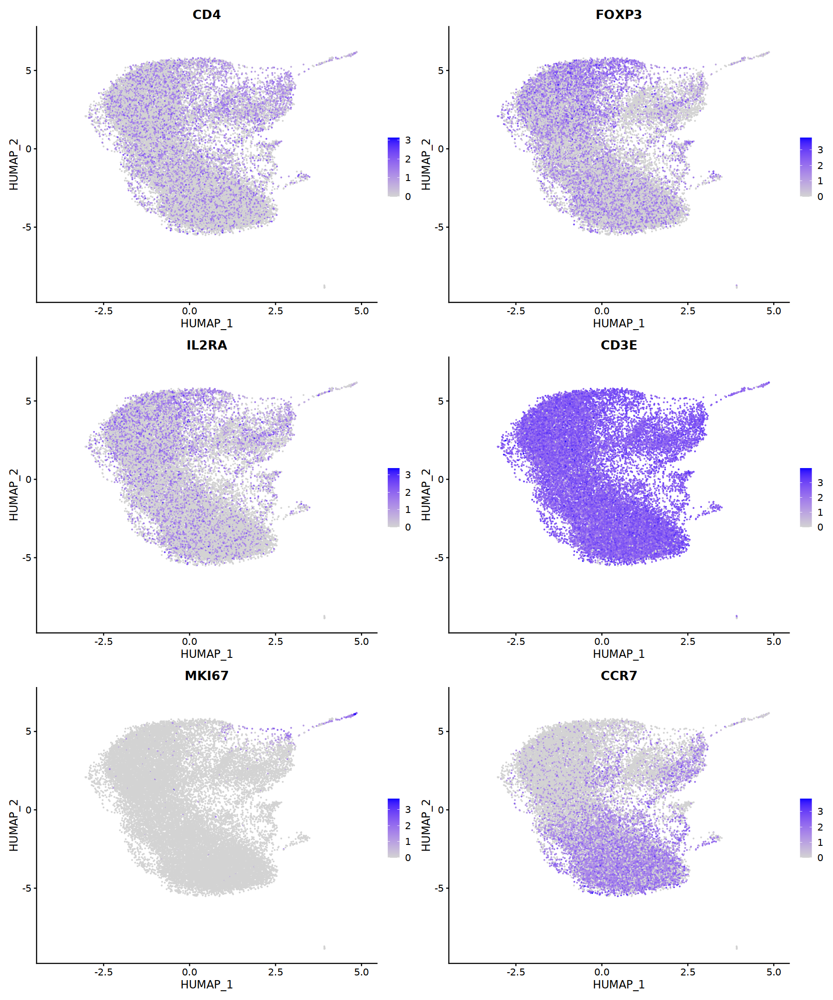

In [82]:
fig.size(18, 15)
FeaturePlot(ctrl.sub, c("CD4", "FOXP3", "IL2RA", "CD3E", "MKI67", "CCR7"))

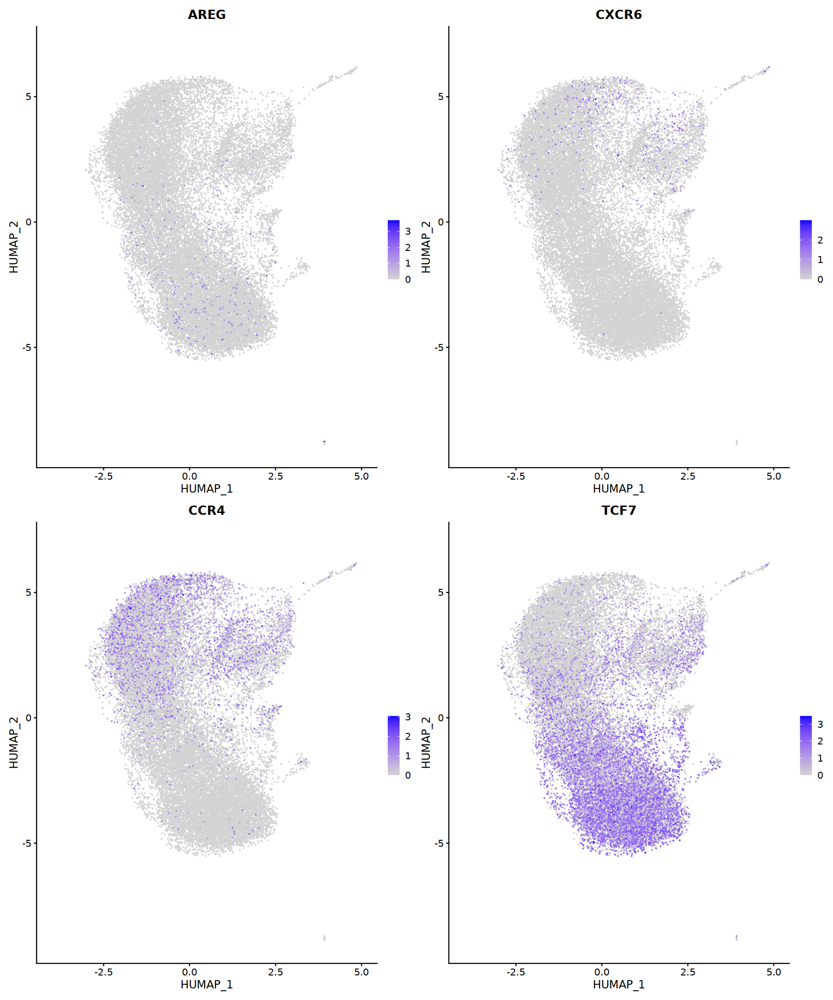

In [83]:
FeaturePlot(ctrl.sub, c("AREG", "CXCR6", "CCR4", "TCF7"))

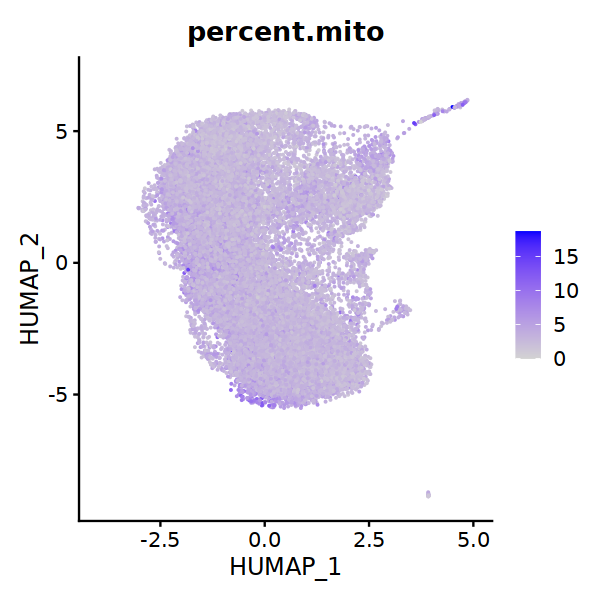

In [84]:
fig.size(5,5)
FeaturePlot(ctrl.sub, features = "percent.mito")

### Cluster markers with single cells

In [123]:
clust.markers <- wilcoxauc(ctrl.sub, "seurat_clusters")

In [124]:
clust.markers %>%
    group_by(group) %>% filter(padj <0.05 & auc > 0.6) %>% 
    slice_max(n = 30, order_by = logFC) %>% 
    select(feature, group) %>% 
    mutate(row = row_number()) %>% 
    tidyr::pivot_wider(names_from = group, values_from = feature)

row,0,1,2,3,4,5,6,7
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,S100A4,CCR7,EEF1B2,CRIP1,TRBV7-5,IFI6,TUBA1B,PPBP
2,CD74,TCF7,RPL36A,AQP3,TRBV7-6,ISG15,STMN1,CAVIN2
3,IL32,PRKCQ-AS1,RPL32,COTL1,TRBV7-4,LY6E,HIST1H4C,NRGN
4,CRIP1,GAS5,RPS12,S100A11,NA,MX1,RRM2,PF4
5,HLA-DRB1,EEF1B2,RPL12,S100A4,NA,STAT1,TUBB,CCL5
6,HLA-DRB5,SNHG29,RPS6,SRGN,NA,IFITM1,HMGB2,TUBB1
7,SH3BGRL3,TXK,RPS5,ANXA1,NA,IFI44L,H2AFZ,SPARC
8,ANXA2,RPS12,RPL36,NEAT1,NA,OAS1,TYMS,GNG11
9,HLA-DPB1,RPS13,RPS18,LIMS1,NA,TRIM22,MKI67,CLU


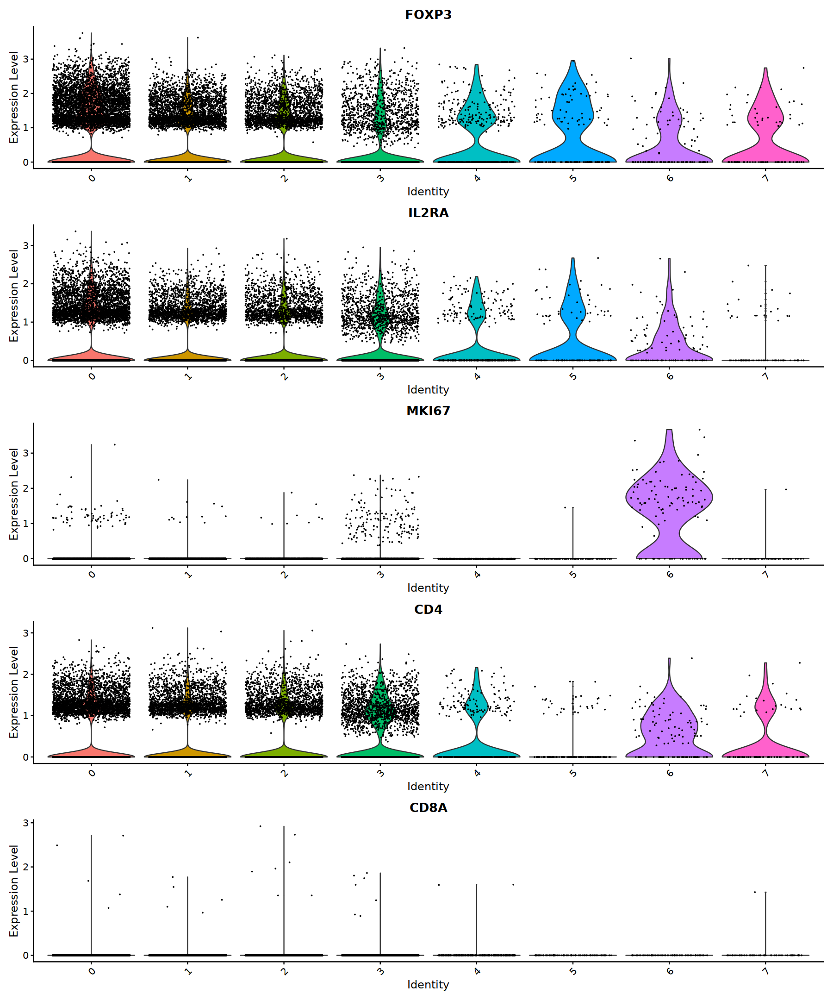

In [116]:
fig.size(18, 15)
VlnPlot(ctrl.sub, c("FOXP3", "IL2RA", "MKI67", "CD4", "CD8A"), ncol = 1, pt.size = 0.00000001)

`summarise()` has grouped output by 'seurat_clusters'. You can override using
the `.groups` argument.


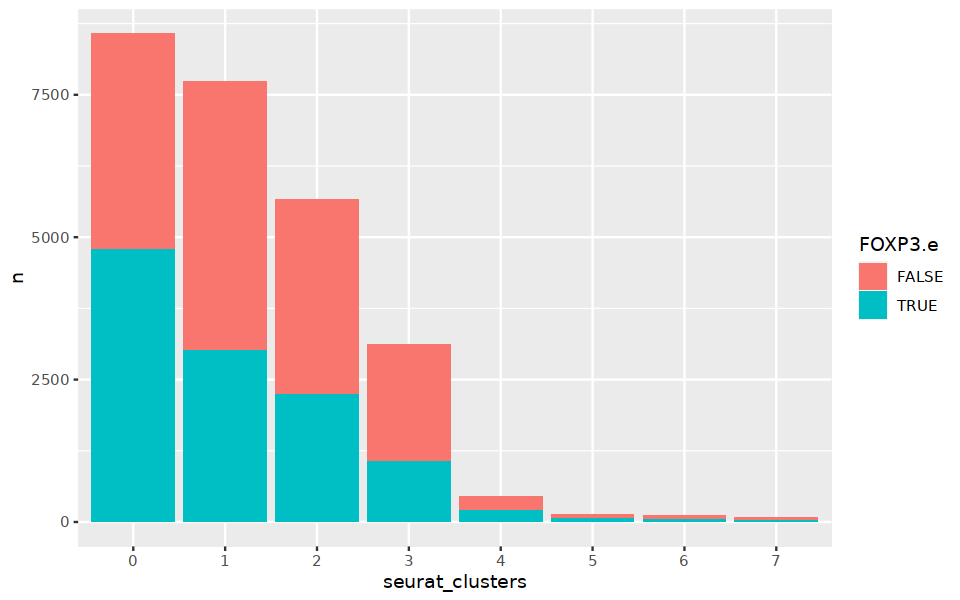

In [125]:
fig.size(5,8)
#number of cells per cluster
p.cells.foxp3 <- FetchData(ctrl.sub, vars= c("FOXP3", "seurat_clusters"), assay="RNA", slot = "data")
p.cells.foxp3 <- p.cells.foxp3%>% mutate(FOXP3.e = FOXP3 > 0)%>% group_by(seurat_clusters, FOXP3.e)%>% summarise(n = n())%>% ungroup()
ggplot(p.cells.foxp3, aes(x=seurat_clusters, y=n, fill = FOXP3.e)) + geom_bar(stat = "identity") 

In [126]:
## Save Tregs
saveRDS(ctrl.sub, paste0(save_path,"/Ctrl_BL_Luo_filtered_Tregs.rds"))

In [4]:
ctrl.sub <- readRDS(paste0(save_path,"/Ctrl_BL_Luo_filtered_Tregs.rds"))

In [5]:
table(ctrl.sub$seurat_clusters)


   0    1    2    3    4    5    6    7 
8575 7728 5660 3112  440  131  115   86 

In [6]:
f <- FetchData(ctrl.sub, c("FOXP3", "IL2RA","seurat_clusters"))
f %>% group_by(seurat_clusters) %>% summarise(FOXP3.c = sum(FOXP3 > 1)/n()) %>% arrange(desc(FOXP3.c))
f %>% group_by(seurat_clusters) %>% summarise(IL2RA.c = sum(IL2RA > 1)/n()) %>% arrange(desc(IL2RA.c))

# f %>% group_by(seurat_clusters) %>% summarise(m = median(FOXP3)) %>% arrange(desc(m))
# # f %>% group_by(seurat_clusters) %>% summarise(IL2RA.c = sum(IL2RA > 0)/n()) %>% arrange(desc(IL2RA.c))

seurat_clusters,FOXP3.c
<fct>,<dbl>
0,0.5485714
5,0.4656489
4,0.4500000
7,0.3953488
2,0.3853357
1,0.3813406
3,0.2808483
6,0.2695652


seurat_clusters,IL2RA.c
<fct>,<dbl>
0,0.3872886
5,0.3206107
3,0.2830977
2,0.2761484
4,0.2750000
1,0.2572464
7,0.2209302
6,0.1565217
